In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("bmadushanirodrigo/fracture-multi-region-x-ray-data")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'fracture-multi-region-x-ray-data' dataset.
Path to dataset files: /kaggle/input/fracture-multi-region-x-ray-data


In [2]:
# 0. IMPORTS & CONFIG
# ============================
import os
import types
from collections import Counter

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split   # ### CHANGED
from torchvision import datasets, transforms, models

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from contextlib import contextmanager

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [14]:
# Đường dẫn tới folder chứa BoneFractureDataset
# Cấu trúc:
# BoneFractureDataset/
#   ├─ training/
#   └─ testing/
data_root = "/kaggle/input/fracture-multi-region-x-ray-data/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification"  # ### CHANGED

IMG_SIZE = 224
BATCH_SIZE = 16
LR = 1e-4
NUM_EPOCHS = 3
TRAIN_MODELS = True  # True nếu muốn train, False nếu chỉ dùng để infer + Grad-CAM

In [15]:
# ============================
# 1. DATASET & DATALOADERS
# ============================
transform_train = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

transform_eval = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# Dataset gãy xương chỉ có training & testing
train_dir = os.path.join(data_root, "train")  # ### CHANGED
test_dir  = os.path.join(data_root, "test")   # ### CHANGED
val_dir = os.path.join(data_root, "val")  # ### CHANGED


# # Tạo full training set rồi tách thành train/val
# full_train_dataset = datasets.ImageFolder(train_dir, transform=transform_train)  # ### CHANGED

# # chia 90% train, 10% val (bạn có thể chỉnh tỉ lệ)
# val_ratio = 0.1
# train_size = int((1 - val_ratio) * len(full_train_dataset))
# val_size = len(full_train_dataset) - train_size
# train_dataset, val_dataset = random_split(
#     full_train_dataset,
#     [train_size, val_size],
#     generator=torch.Generator().manual_seed(42)
# )  # ### CHANGED





train_dataset  = datasets.ImageFolder(f"{data_root}/train",  transform=transform_train)
val_dataset   = datasets.ImageFolder(f"{data_root}/val",   transform=transform_eval)
test_dataset  = datasets.ImageFolder(f"{data_root}/test",  transform=transform_eval)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
val_loader   = DataLoader(val_dataset,   batch_size=16, shuffle=False, num_workers=4)
test_loader  = DataLoader(test_dataset,  batch_size=16, shuffle=False, num_workers=4)


# class_to_idx được lưu trong full_train_dataset (ImageFolder gốc)
print("Class to idx:", train_dataset.class_to_idx)  # ### CHANGED
# ví dụ: {'fractured': 0, 'not_fractured': 1} (tuỳ theo tên thư mục thật)


Class to idx: {'fractured': 0, 'not fractured': 1}


In [16]:
from PIL import Image, ImageFile   # <-- sửa ở đây
ImageFile.LOAD_TRUNCATED_IMAGES = True
def count_class(dataset):
    labels = [label for _, label in dataset]
    return Counter(labels)

print("Train class counts:", count_class(train_dataset))
print("Val class counts:",   count_class(val_dataset))
print("Test class counts:",  count_class(test_dataset))

Train class counts: Counter({1: 4640, 0: 4606})
Val class counts: Counter({1: 492, 0: 337})
Test class counts: Counter({1: 268, 0: 238})


In [17]:
# ============================
# 2. MODEL DEFINITIONS (binary)
# ============================
def get_densenet121_pneumonia(num_classes=1, use_imagenet_weights=True):
    if use_imagenet_weights:
        model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)
    else:
        model = models.densenet121(weights=None)
    num_features = model.classifier.in_features
    model.classifier = nn.Linear(num_features, num_classes)
    return model


def get_resnet50_pneumonia(num_classes=1, use_imagenet_weights=True):
    if use_imagenet_weights:
        model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
    else:
        model = models.resnet50(weights=None)
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, num_classes)
    return model


def remove_inplace_relu(m):
    if isinstance(m, nn.ReLU):
        m.inplace = False


# --- Khởi tạo DenseNet-121 ---
densenet = get_densenet121_pneumonia().to(device)
densenet.apply(remove_inplace_relu)

# Override forward để bỏ F.relu(..., inplace=True) trong torchvision
def densenet121_forward_no_inplace(self, x):
    features = self.features(x)
    out = F.relu(features, inplace=False)
    out = F.adaptive_avg_pool2d(out, (1, 1))
    out = torch.flatten(out, 1)
    out = self.classifier(out)
    return out

densenet.forward = types.MethodType(densenet121_forward_no_inplace, densenet)
densenet.eval()

# --- Khởi tạo ResNet-50 ---
resnet = get_resnet50_pneumonia().to(device)
resnet.apply(remove_inplace_relu)
resnet.eval()

# Loss & optimizer (nếu train)
criterion = nn.BCEWithLogitsLoss()
optimizer_dn = torch.optim.Adam(densenet.parameters(), lr=LR)
optimizer_rn = torch.optim.Adam(resnet.parameters(),   lr=LR)


In [18]:
# ============================
# 3. TRAINING & EVALUATION
# ============================
def train_one_epoch(model, optimizer, loader):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device)  # [B] -> [B,1]

        optimizer.zero_grad()
        logits = model(images)            # [B,1]
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = (torch.sigmoid(logits) >= 0.5).long()
        correct += (preds.cpu().numpy() == labels.cpu().numpy()).sum()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc


@torch.no_grad()
def eval_model(model, loader):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device)

        logits = model(images)
        loss = criterion(logits, labels)

        running_loss += loss.item() * images.size(0)
        preds = (torch.sigmoid(logits) >= 0.5).long()
        correct += (preds.cpu().numpy() == labels.cpu().numpy()).sum()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc


if TRAIN_MODELS:
    print("=== Train DenseNet-121 (Bone fracture) ===")
    for epoch in range(NUM_EPOCHS):
        train_loss, train_acc = train_one_epoch(densenet, optimizer_dn, train_loader)
        val_loss, val_acc = eval_model(densenet, val_loader)
        print(f"[DN] Epoch {epoch+1}/{NUM_EPOCHS} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    torch.save(densenet.state_dict(), "densenet121_bonefracture.pth")  # ### CHANGED

    print("=== Train ResNet-50 (Bone fracture) ===")
    for epoch in range(NUM_EPOCHS):
        train_loss, train_acc = train_one_epoch(resnet, optimizer_rn, train_loader)
        val_loss, val_acc = eval_model(resnet, val_loader)
        print(f"[RN] Epoch {epoch+1}/{NUM_EPOCHS} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    torch.save(resnet.state_dict(), "resnet50_bonefracture.pth")       # ### CHANGED

# Nếu bạn đã train trước đó, có thể load lại:
# densenet.load_state_dict(torch.load("densenet121_bonefracture.pth", map_location=device))
# resnet.load_state_dict(torch.load("resnet50_bonefracture.pth", map_location=device))
# densenet.eval(); resnet.eval()

=== Train DenseNet-121 (Bone fracture) ===
[DN] Epoch 1/10 - Train Loss: 0.0947, Train Acc: 0.9663, Val Loss: 0.0713, Val Acc: 0.9807
[DN] Epoch 2/10 - Train Loss: 0.0221, Train Acc: 0.9934, Val Loss: 0.0278, Val Acc: 0.9891
[DN] Epoch 3/10 - Train Loss: 0.0104, Train Acc: 0.9973, Val Loss: 0.0134, Val Acc: 0.9964
[DN] Epoch 4/10 - Train Loss: 0.0140, Train Acc: 0.9947, Val Loss: 0.0068, Val Acc: 0.9976
[DN] Epoch 5/10 - Train Loss: 0.0093, Train Acc: 0.9972, Val Loss: 0.0143, Val Acc: 0.9940
[DN] Epoch 6/10 - Train Loss: 0.0104, Train Acc: 0.9969, Val Loss: 0.0606, Val Acc: 0.9747
[DN] Epoch 7/10 - Train Loss: 0.0096, Train Acc: 0.9975, Val Loss: 0.0222, Val Acc: 0.9928
[DN] Epoch 8/10 - Train Loss: 0.0124, Train Acc: 0.9973, Val Loss: 0.0259, Val Acc: 0.9928
[DN] Epoch 9/10 - Train Loss: 0.0035, Train Acc: 0.9990, Val Loss: 0.0119, Val Acc: 0.9964
[DN] Epoch 10/10 - Train Loss: 0.0009, Train Acc: 0.9998, Val Loss: 0.0062, Val Acc: 0.9988
=== Train ResNet-50 (Bone fracture) ===
[RN] E

In [19]:
# ============================
# 4. HOOK & CAM IMPLEMENTATION
# ============================
class FeatureExtractor2D:
    """
    Hook forward + backward cho layer tích chập (2D).
    Dùng với DenseNet-121: target_layer = model.features hoặc model.features[-1]
    Dùng với ResNet-50:   target_layer = model.layer4[-1]
    """
    def __init__(self, target_module: nn.Module):
        self.target_module = target_module
        self.activations = None
        self.gradients = None
        self._fwd_handle = target_module.register_forward_hook(self._forward_hook)
        self._bwd_handle = target_module.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.activations = output.detach().clone()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach().clone()

    def close(self):
        self._fwd_handle.remove()
        self._bwd_handle.remove()


@contextmanager
def eval_mode(model):
    was_training = model.training
    try:
        model.eval()
        yield model
    finally:
        if was_training:
            model.train()


class GradCAM2D:
    def __init__(self, model: nn.Module, target_layer: nn.Module):
        self.model = model
        self.extractor = FeatureExtractor2D(target_layer)

    def __del__(self):
        self.extractor.close()

    def _compute_cam(self, activations, gradients):
        """
        activations: [1, C, H, W]
        gradients:   [1, C, H, W]
        """
        N, C, H, W = gradients.shape
        alpha = gradients.view(N, C, -1).mean(dim=2)   # [1, C]
        alpha = alpha.view(N, C, 1, 1)                 # [1, C, 1, 1]
        weighted = alpha * activations                 # [1, C, H, W]
        cam = weighted.sum(dim=1, keepdim=True)        # [1, 1, H, W]
        cam = F.relu(cam)
        return cam

    def generate_cam(self, input_image: torch.Tensor, pneumonia_class=True, normalize=True):
        """
        input_image: [1, 3, H, W]
        pneumonia_class: với bài toán gãy xương thì hiểu là "lớp dương (fractured)"  # ### CHANGED comment
        """
        self.model.zero_grad()
        with eval_mode(self.model):
            logits = self.model(input_image)  # [1,1]

        # Với binary (1 logit), logit dương là score của lớp POSITIVE
        score = logits[0, 0]
        if not pneumonia_class:
            score = -score   # nếu muốn giải thích lớp NEGATIVE (không gãy)

        score.backward(retain_graph=True)

        activations = self.extractor.activations
        gradients   = self.extractor.gradients
        cam = self._compute_cam(activations, gradients)

        # resize về size input
        _, _, H_in, W_in = input_image.shape
        cam = F.interpolate(cam, size=(H_in, W_in),
                            mode='bilinear', align_corners=False)

        if normalize:
            cam_min, cam_max = cam.min(), cam.max()
            if cam_max > cam_min:
                cam = (cam - cam_min) / (cam_max - cam_min + 1e-8)

        return cam.detach()  # [1,1,H,W]


class HiResCAM2D:
    def __init__(self, model: nn.Module, target_layer: nn.Module):
        self.model = model
        self.extractor = FeatureExtractor2D(target_layer)

    def __del__(self):
        self.extractor.close()

    def _compute_cam(self, activations, gradients):
        """
        HiResCAM: sum_c(grad_c * act_c)
        """
        prod = gradients * activations            # [1, C, H, W]
        cam = prod.sum(dim=1, keepdim=True)       # [1, 1, H, W]
        cam = F.relu(cam)
        return cam

    def generate_cam(self, input_image: torch.Tensor, pneumonia_class=True, normalize=True):
        """
        pneumonia_class: True = giải thích lớp POSITIVE (vd: gãy xương)  # ### CHANGED comment
        """
        self.model.zero_grad()
        with eval_mode(self.model):
            logits = self.model(input_image)  # [1,1]

        score = logits[0, 0]
        if not pneumonia_class:
            score = -score

        score.backward(retain_graph=True)

        activations = self.extractor.activations
        gradients   = self.extractor.gradients
        cam = self._compute_cam(activations, gradients)

        _, _, H_in, W_in = input_image.shape
        cam = F.interpolate(cam, size=(H_in, W_in),
                            mode='bilinear', align_corners=False)

        if normalize:
            cam_min, cam_max = cam.min(), cam.max()
            if cam_max > cam_min:
                cam = (cam - cam_min) / (cam_max - cam_min + 1e-8)

        return cam.detach()  # [1,1,H,W]


In [20]:
# ============================
# 5. VISUALIZATION UTILITIES
# ============================
def denormalize_img(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406], device=tensor.device).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225], device=tensor.device).view(3,1,1)
    img = tensor * std + mean
    img = torch.clamp(img, 0, 1)
    return img

def show_overlay_from_tensor(input_tensor, cam, title="CAM"):
    img = denormalize_img(input_tensor[0]).permute(1,2,0).detach().cpu().numpy()  # [H,W,3]
    cam_np = cam[0,0].detach().cpu().numpy()                                      # [H,W]

    plt.figure(figsize=(5,4))
    plt.imshow(img, cmap='gray')
    plt.imshow(cam_np, cmap='jet', alpha=0.4)
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

Sample label: 0


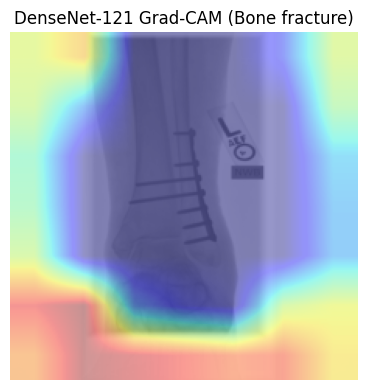

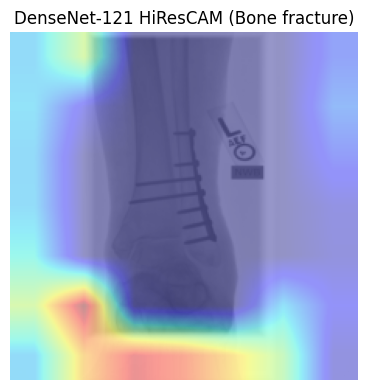

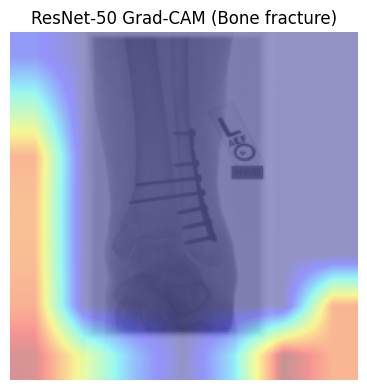

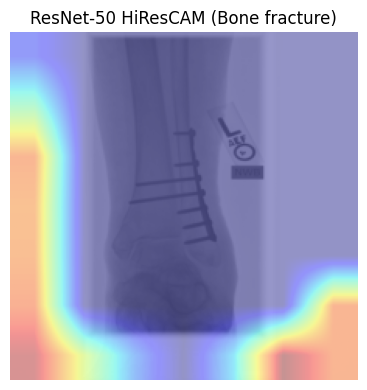

In [21]:
# ============================
# 6. DEMO: LẤY 1 ẢNH TEST & SINH CAM
# ============================
test_iter = iter(test_loader)
sample_imgs, sample_labels = next(test_iter)

img0 = sample_imgs[0:1].to(device)   # [1,3,H,W]
label0 = sample_labels[0].item()     # 0/1 tuỳ theo class_to_idx của bộ gãy xương  # ### CHANGED comment
print("Sample label:", label0)

# CAM cho DenseNet-121
target_layer_dn = densenet.features
grad_cam_dn  = GradCAM2D(densenet, target_layer_dn)
hires_cam_dn = HiResCAM2D(densenet, target_layer_dn)

grad_cam_map_dn  = grad_cam_dn.generate_cam(img0, pneumonia_class=True)
hires_cam_map_dn = hires_cam_dn.generate_cam(img0, pneumonia_class=True)

show_overlay_from_tensor(img0, grad_cam_map_dn,  title="DenseNet-121 Grad-CAM (Bone fracture)")
show_overlay_from_tensor(img0, hires_cam_map_dn, title="DenseNet-121 HiResCAM (Bone fracture)")

# CAM cho ResNet-50
target_layer_rn = resnet.layer4[-1]
grad_cam_rn  = GradCAM2D(resnet, target_layer_rn)
hires_cam_rn = HiResCAM2D(resnet, target_layer_rn)

grad_cam_map_rn  = grad_cam_rn.generate_cam(img0, pneumonia_class=True)
hires_cam_map_rn = hires_cam_rn.generate_cam(img0, pneumonia_class=True)

show_overlay_from_tensor(img0, grad_cam_map_rn,  title="ResNet-50 Grad-CAM (Bone fracture)")
show_overlay_from_tensor(img0, hires_cam_map_rn, title="ResNet-50 HiResCAM (Bone fracture)")


Test class_to_idx: {'fractured': 0, 'not fractured': 1}
Tổng số ảnh test gãy xương: 238
Đang dùng 20 ảnh đầu tiên để test và sinh CAM.

=== Ảnh test index 0 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-10.0245, prob=0.0000, pred=0
  ResNet : logit=-11.9811, prob=0.0000, pred=0


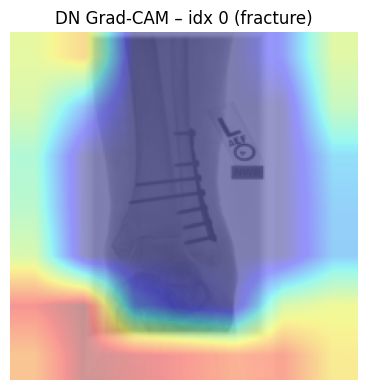

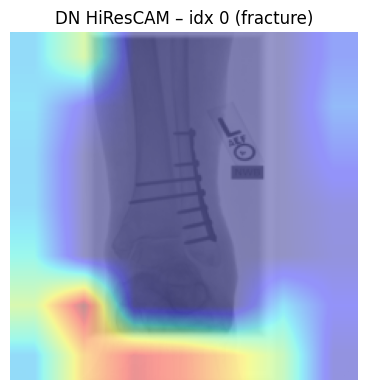

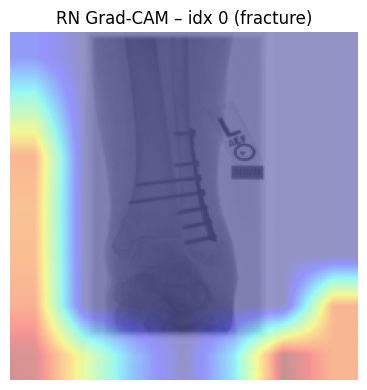

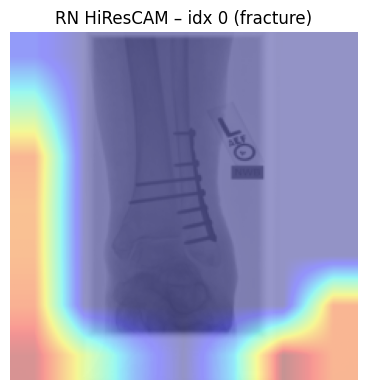


=== Ảnh test index 1 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=6.9364, prob=0.9990, pred=1
  ResNet : logit=4.8668, prob=0.9924, pred=1


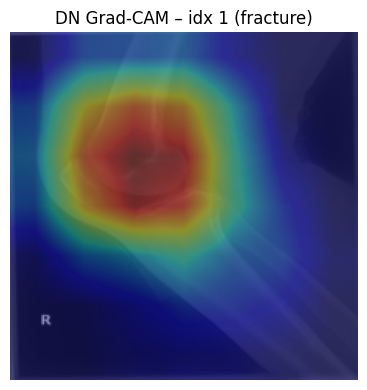

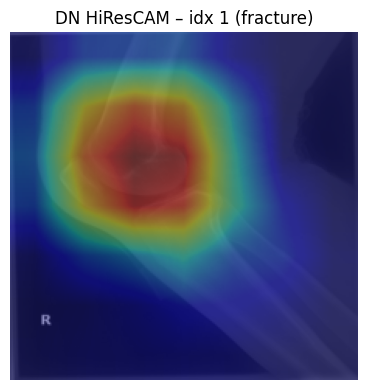

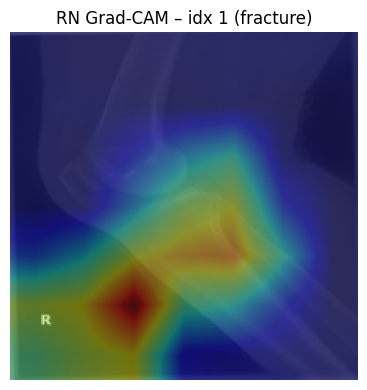

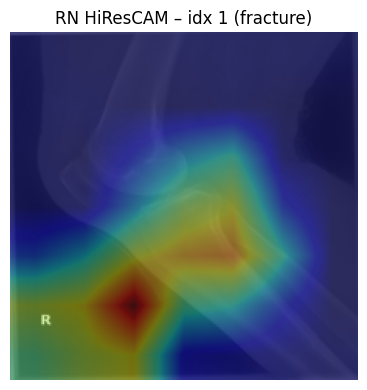


=== Ảnh test index 2 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-9.6140, prob=0.0001, pred=0
  ResNet : logit=-4.8211, prob=0.0080, pred=0


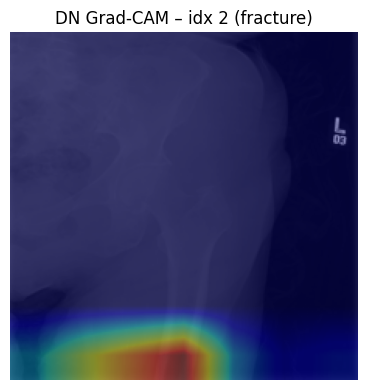

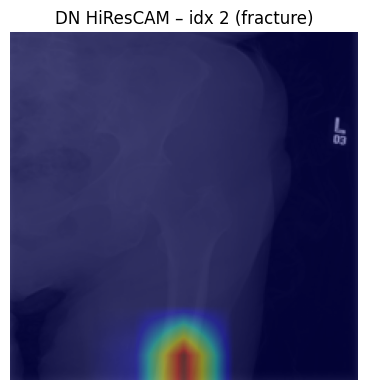

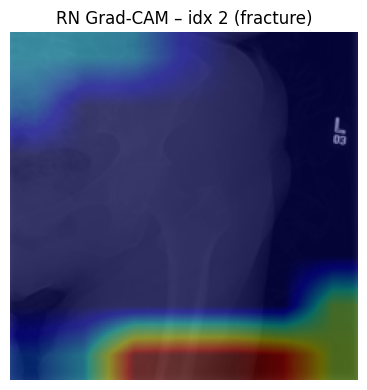

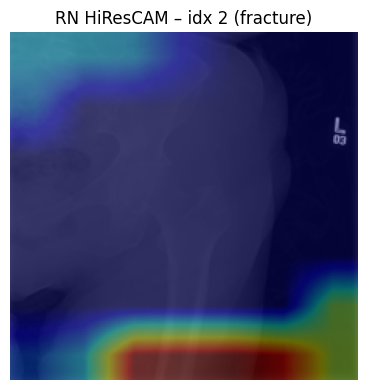


=== Ảnh test index 3 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-9.6140, prob=0.0001, pred=0
  ResNet : logit=-4.8211, prob=0.0080, pred=0


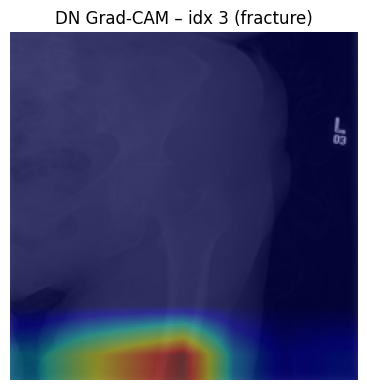

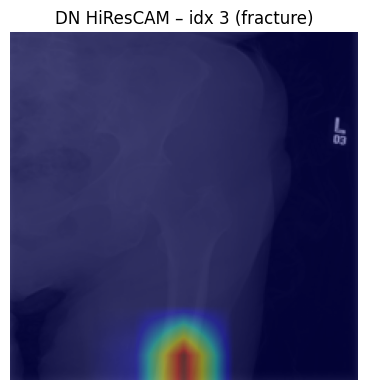

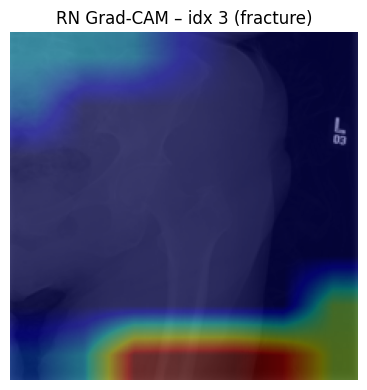

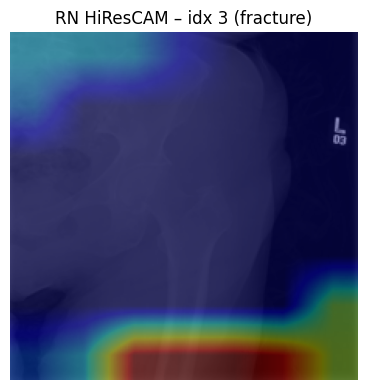


=== Ảnh test index 4 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-7.9845, prob=0.0003, pred=0
  ResNet : logit=-5.8851, prob=0.0028, pred=0


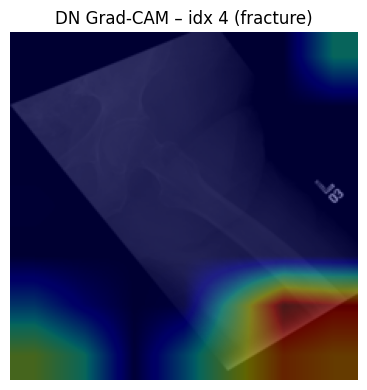

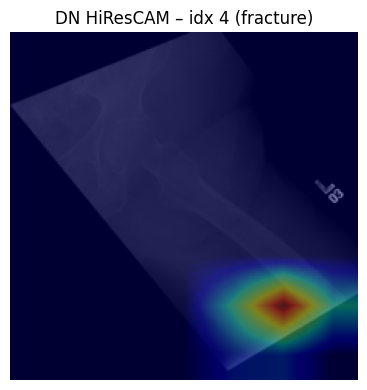

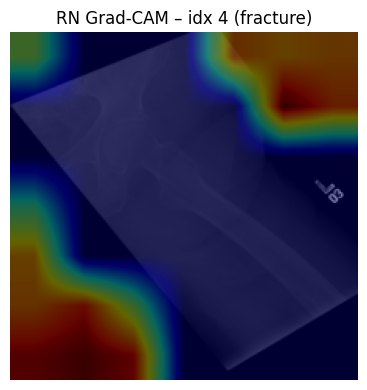

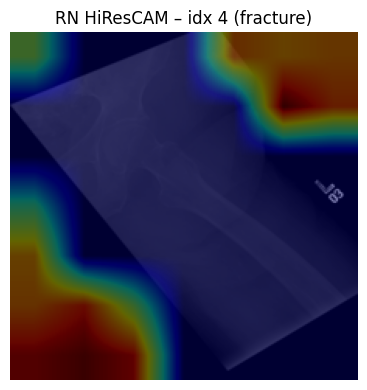


=== Ảnh test index 5 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-9.6140, prob=0.0001, pred=0
  ResNet : logit=-4.8211, prob=0.0080, pred=0


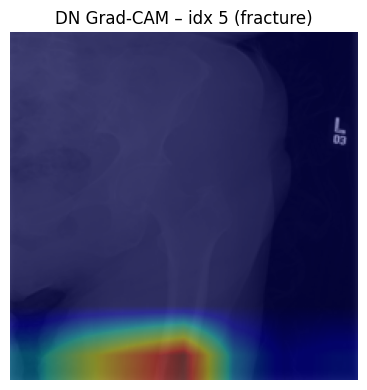

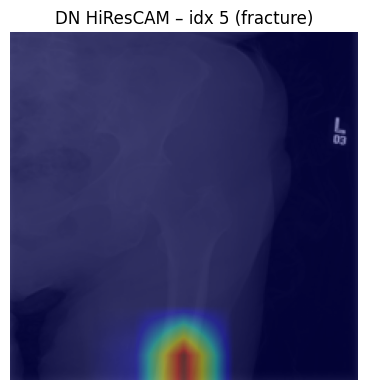

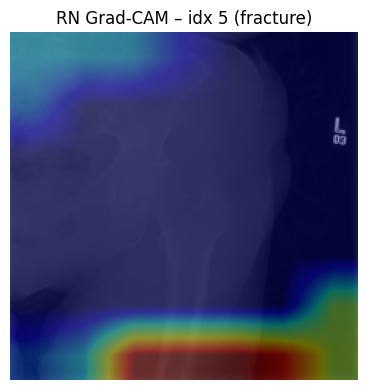

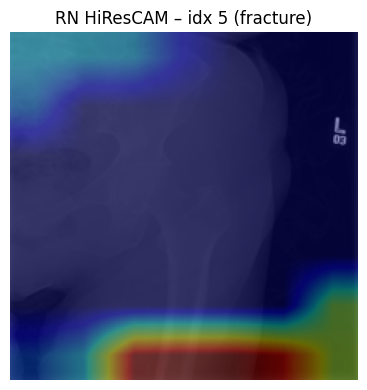


=== Ảnh test index 6 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-7.9845, prob=0.0003, pred=0
  ResNet : logit=-5.8851, prob=0.0028, pred=0


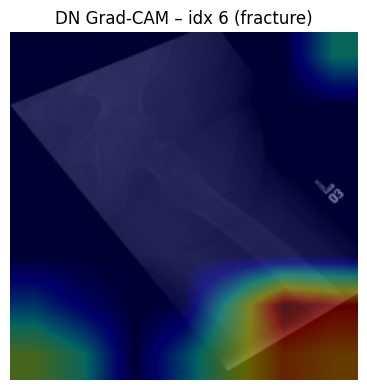

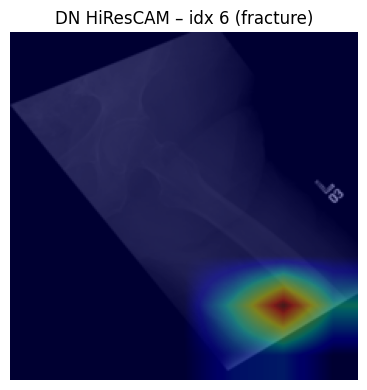

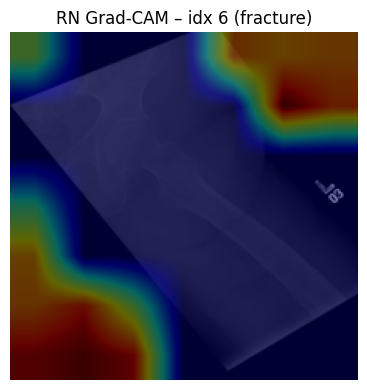

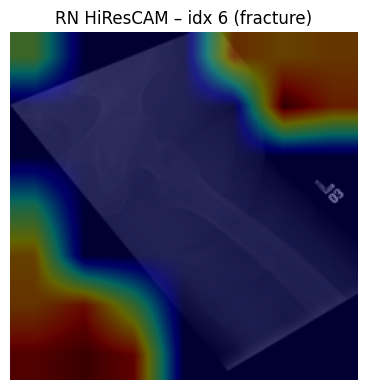


=== Ảnh test index 7 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-7.9845, prob=0.0003, pred=0
  ResNet : logit=-5.8851, prob=0.0028, pred=0


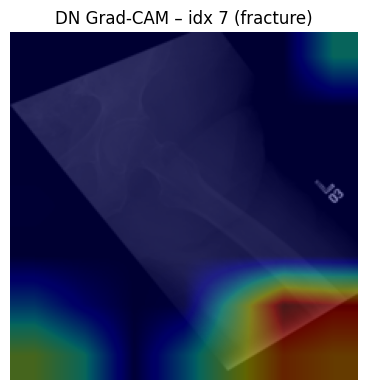

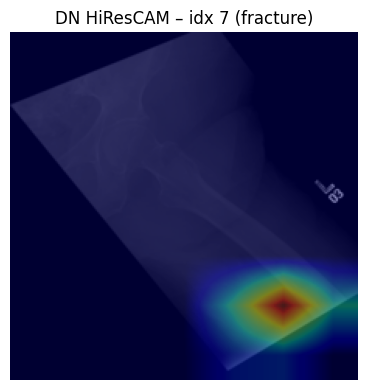

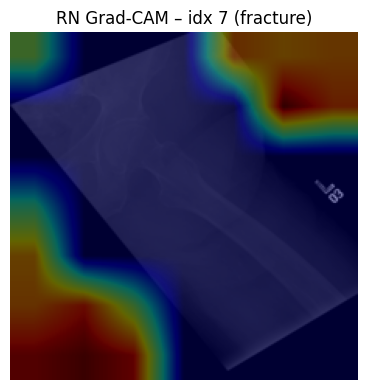

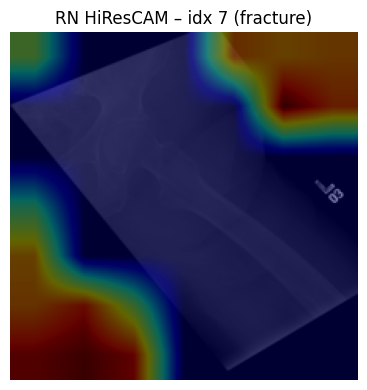


=== Ảnh test index 8 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-7.9845, prob=0.0003, pred=0
  ResNet : logit=-5.8851, prob=0.0028, pred=0


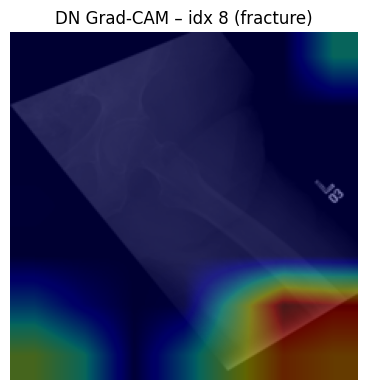

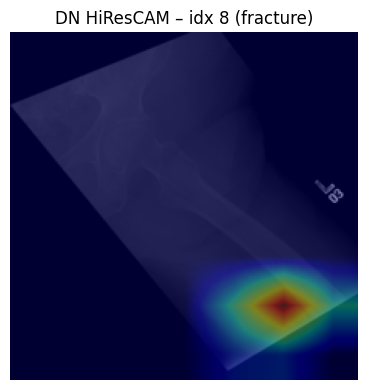

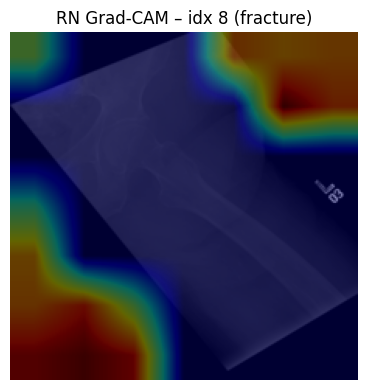

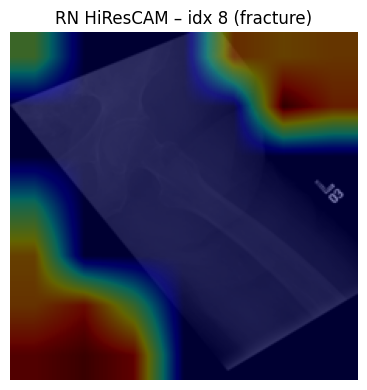


=== Ảnh test index 9 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=6.9364, prob=0.9990, pred=1
  ResNet : logit=4.8668, prob=0.9924, pred=1


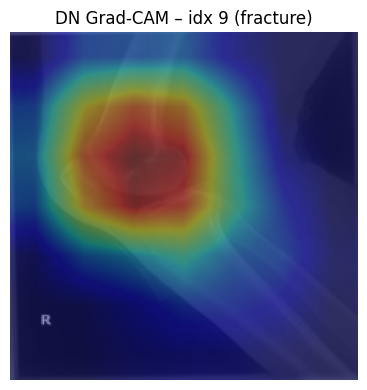

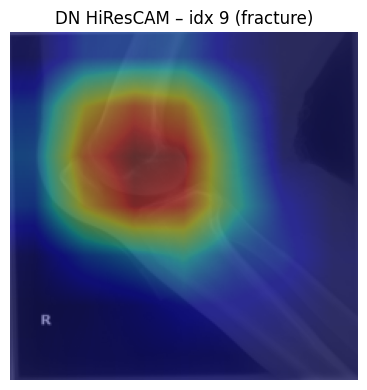

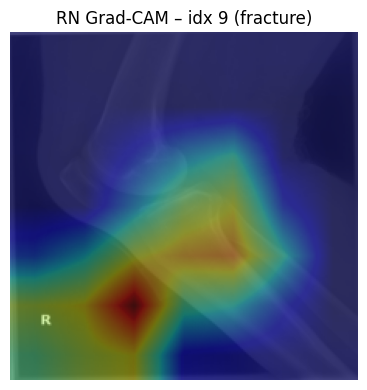

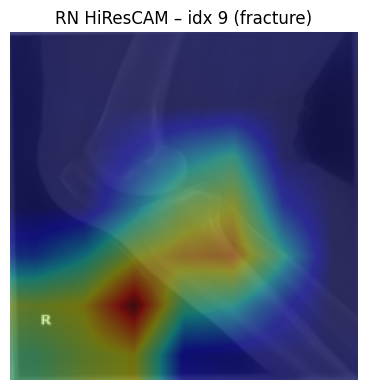


=== Ảnh test index 10 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-15.3960, prob=0.0000, pred=0
  ResNet : logit=-8.3990, prob=0.0002, pred=0


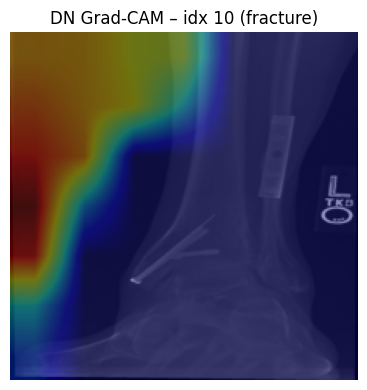

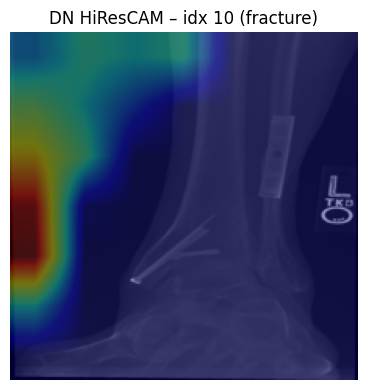

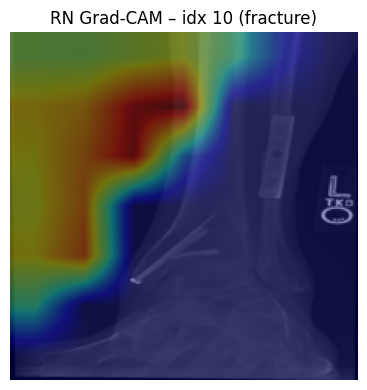

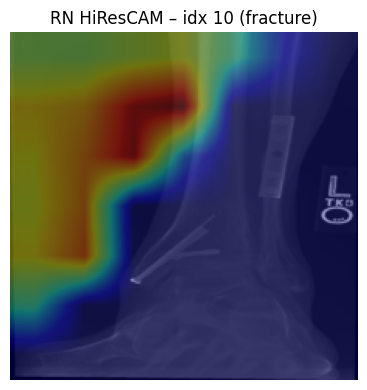


=== Ảnh test index 11 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-15.3960, prob=0.0000, pred=0
  ResNet : logit=-8.3990, prob=0.0002, pred=0


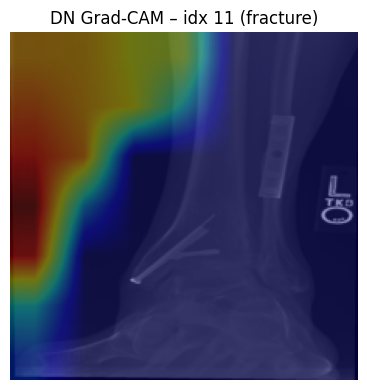

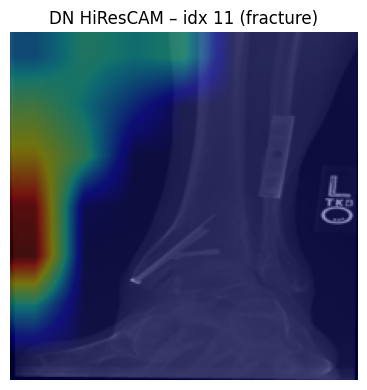

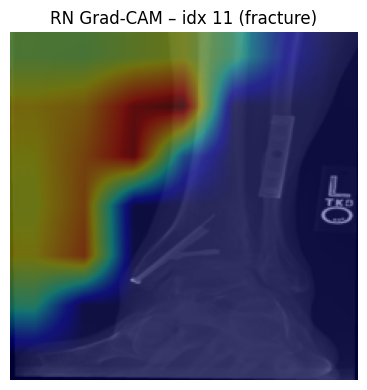

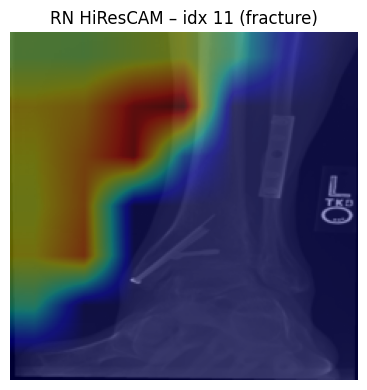


=== Ảnh test index 12 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-16.1960, prob=0.0000, pred=0
  ResNet : logit=-14.0341, prob=0.0000, pred=0


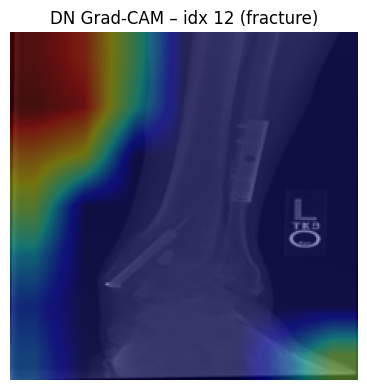

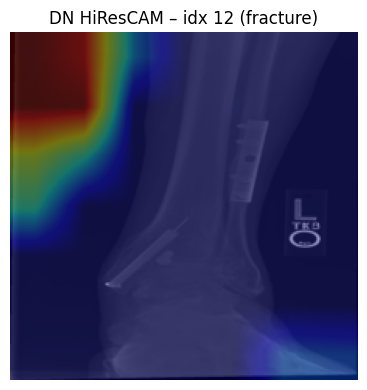

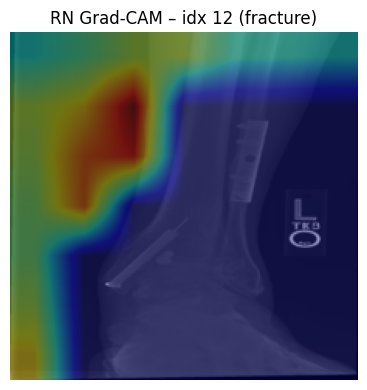

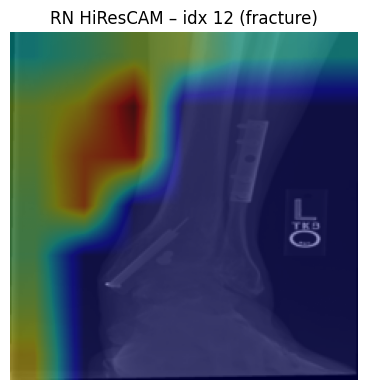


=== Ảnh test index 13 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-13.6013, prob=0.0000, pred=0
  ResNet : logit=-8.2096, prob=0.0003, pred=0


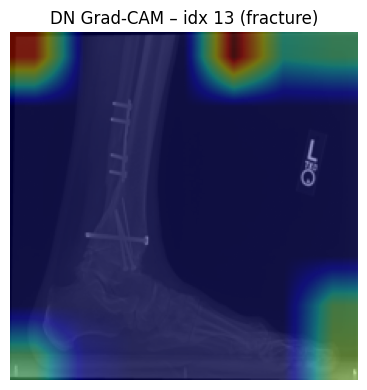

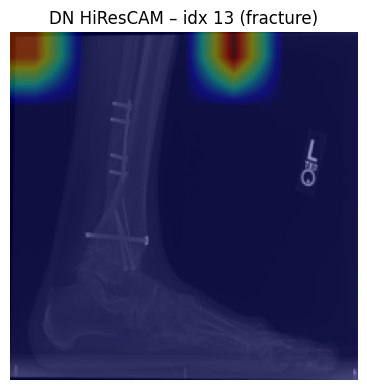

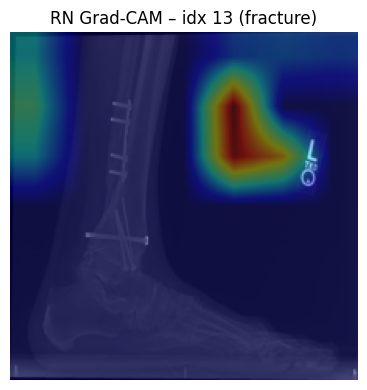

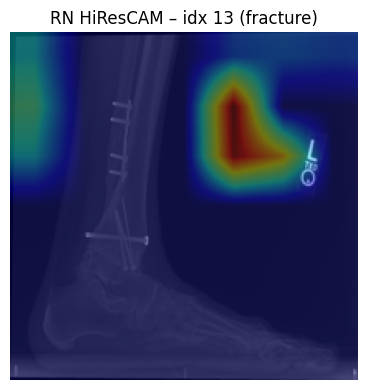


=== Ảnh test index 14 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-13.6013, prob=0.0000, pred=0
  ResNet : logit=-8.2096, prob=0.0003, pred=0


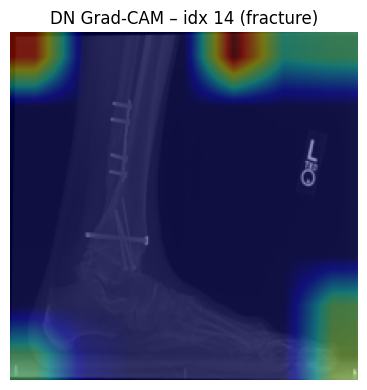

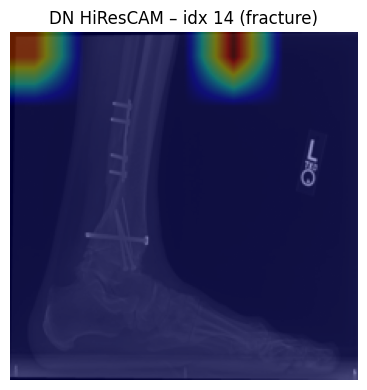

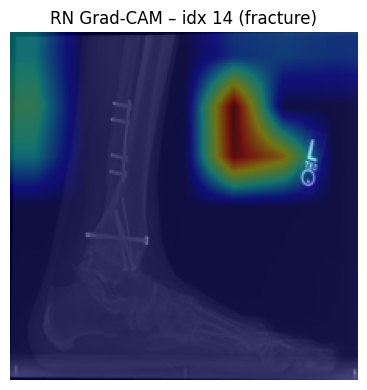

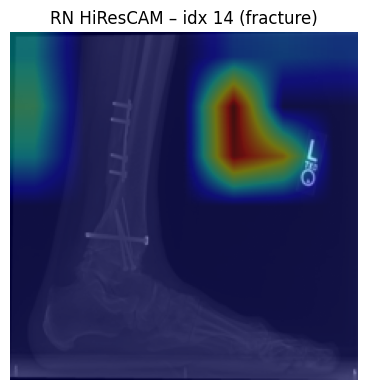


=== Ảnh test index 15 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-16.1960, prob=0.0000, pred=0
  ResNet : logit=-14.0341, prob=0.0000, pred=0


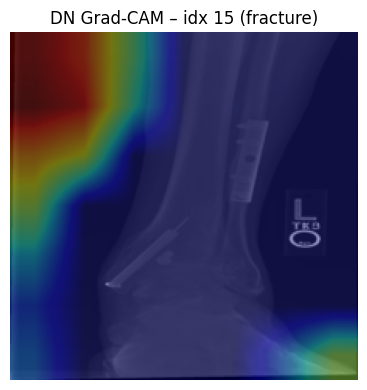

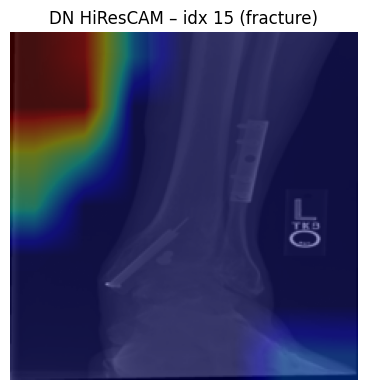

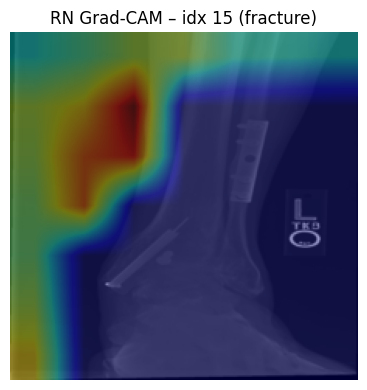

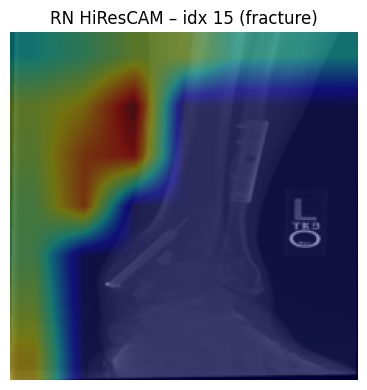


=== Ảnh test index 16 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-13.6013, prob=0.0000, pred=0
  ResNet : logit=-8.2096, prob=0.0003, pred=0


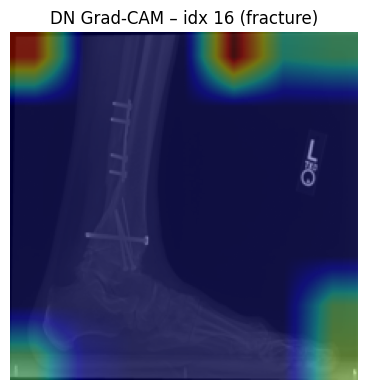

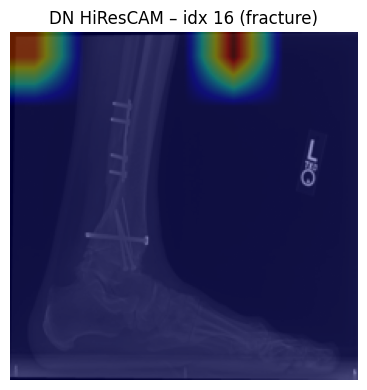

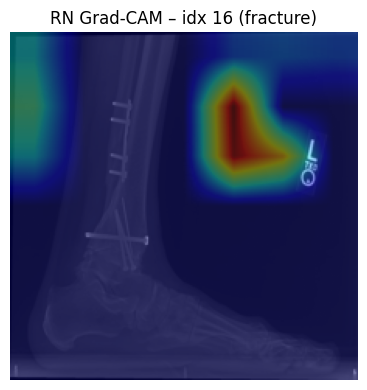

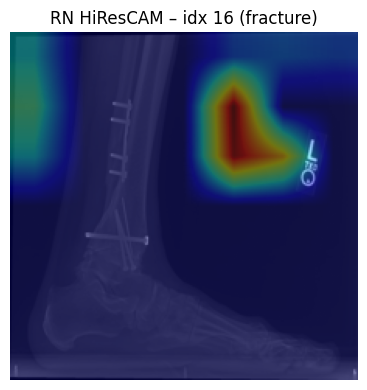


=== Ảnh test index 17 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-15.3960, prob=0.0000, pred=0
  ResNet : logit=-8.3990, prob=0.0002, pred=0


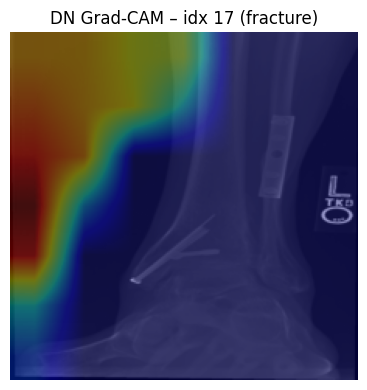

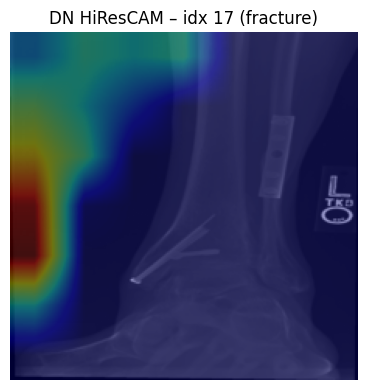

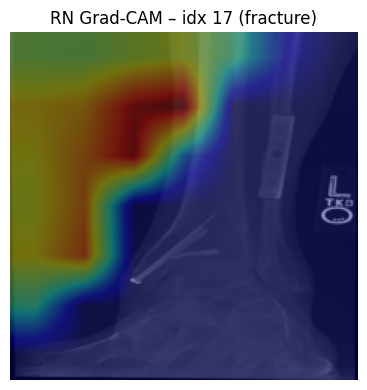

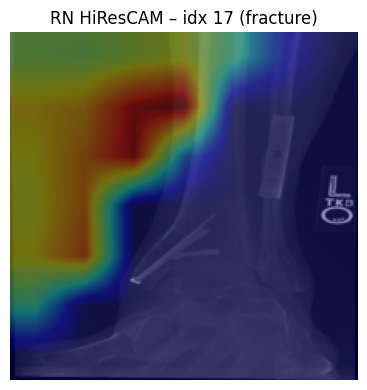


=== Ảnh test index 18 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-13.6013, prob=0.0000, pred=0
  ResNet : logit=-8.2096, prob=0.0003, pred=0


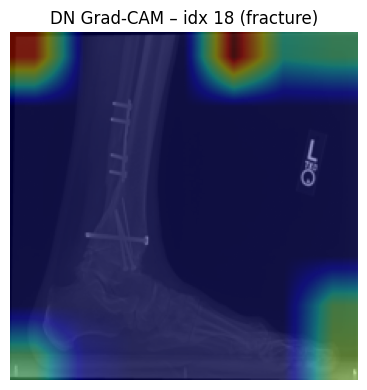

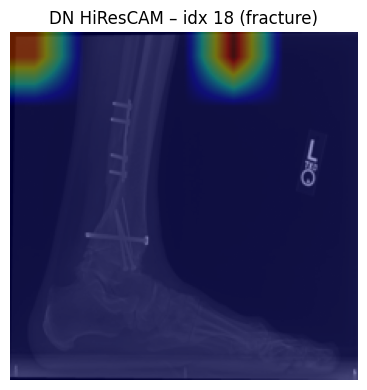

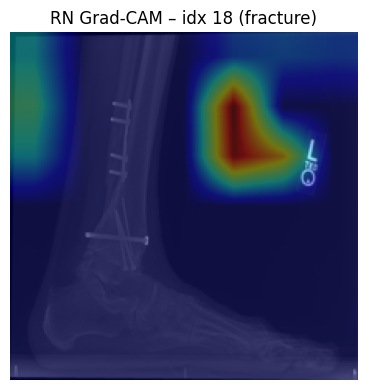

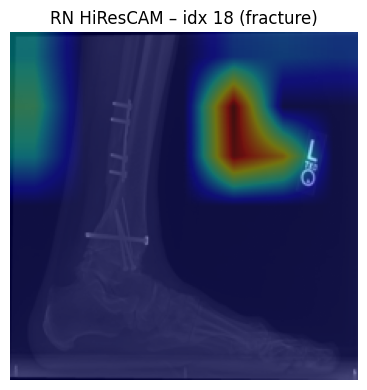


=== Ảnh test index 19 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-9.6140, prob=0.0001, pred=0
  ResNet : logit=-4.8211, prob=0.0080, pred=0


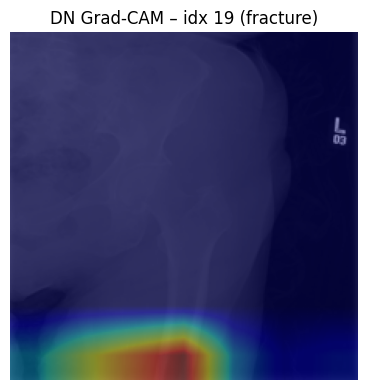

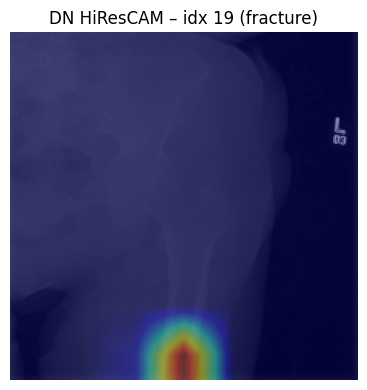

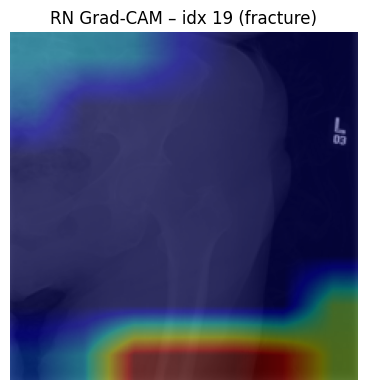

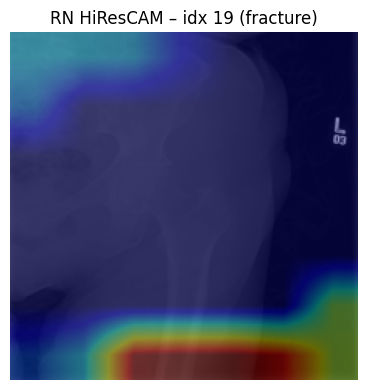

In [22]:
# ============================
# 6. DEMO: 20 ẢNH TEST GÃY XƯƠNG
# ============================

# Xem lại mapping class -> index
print("Test class_to_idx:", test_dataset.class_to_idx)

# Giả sử thư mục của lớp gãy xương tên là "fractured"
# Nếu tên thư mục khác (vd: "Fractured", "fracture", "Positive"...)
# thì bạn sửa lại đúng chuỗi khóa phía dưới cho khớp:
fractured_idx = test_dataset.class_to_idx["fractured"]

# Lấy tất cả index của các mẫu test thuộc lớp gãy xương
fractured_indices = [i for i, (_, y) in enumerate(test_dataset) if y == fractured_idx]

# Lấy tối đa 20 ảnh đầu tiên
selected_indices = fractured_indices[:20]
print(f"Tổng số ảnh test gãy xương: {len(fractured_indices)}")
print(f"Đang dùng {len(selected_indices)} ảnh đầu tiên để test và sinh CAM.")

# Khởi tạo Grad-CAM / HiResCAM cho DenseNet và ResNet
target_layer_dn = densenet.features
grad_cam_dn  = GradCAM2D(densenet, target_layer_dn)
hires_cam_dn = HiResCAM2D(densenet, target_layer_dn)

target_layer_rn = resnet.layer4[-1]
grad_cam_rn  = GradCAM2D(resnet, target_layer_rn)
hires_cam_rn = HiResCAM2D(resnet, target_layer_rn)

for idx in selected_indices:
    # Lấy ảnh và nhãn từ test_dataset
    img, label = test_dataset[idx]      # img: [3,H,W], label == fractured_idx
    img_tensor = img.unsqueeze(0).to(device)  # [1,3,H,W]
    label_int = int(label)

    # ===== Dự đoán với DenseNet =====
    with torch.no_grad():
        logit_dn = densenet(img_tensor)              # [1,1]
        prob_dn = torch.sigmoid(logit_dn)[0, 0].item()
        pred_dn = int(prob_dn >= 0.5)                # 1 ~ dự đoán gãy xương

    # ===== Dự đoán với ResNet =====
    with torch.no_grad():
        logit_rn = resnet(img_tensor)                # [1,1]
        prob_rn = torch.sigmoid(logit_rn)[0, 0].item()
        pred_rn = int(prob_rn >= 0.5)

    print(f"\n=== Ảnh test index {idx} ===")
    print(f"  Nhãn thật (fractured_idx={fractured_idx}): {label_int}")
    print(f"  DenseNet: logit={logit_dn.item():.4f}, prob={prob_dn:.4f}, pred={pred_dn}")
    print(f"  ResNet : logit={logit_rn.item():.4f}, prob={prob_rn:.4f}, pred={pred_rn}")

    # ===== CAM DenseNet (lớp dương = gãy xương) =====
    cam_dn_grad  = grad_cam_dn.generate_cam(img_tensor, pneumonia_class=True)
    cam_dn_hires = hires_cam_dn.generate_cam(img_tensor, pneumonia_class=True)
    show_overlay_from_tensor(
        img_tensor, cam_dn_grad,
        title=f"DN Grad-CAM – idx {idx} (fracture)"
    )
    show_overlay_from_tensor(
        img_tensor, cam_dn_hires,
        title=f"DN HiResCAM – idx {idx} (fracture)"
    )

    # ===== CAM ResNet (lớp dương = gãy xương) =====
    cam_rn_grad  = grad_cam_rn.generate_cam(img_tensor, pneumonia_class=True)
    cam_rn_hires = hires_cam_rn.generate_cam(img_tensor, pneumonia_class=True)
    show_overlay_from_tensor(
        img_tensor, cam_rn_grad,
        title=f"RN Grad-CAM – idx {idx} (fracture)"
    )
    show_overlay_from_tensor(
        img_tensor, cam_rn_hires,
        title=f"RN HiResCAM – idx {idx} (fracture)"
    )


In [23]:
def show_row_with_original_and_cams(img_tensor, cams, titles, suptitle=None):
    """
    Hiển thị 1 hàng ngang:
    - Ảnh gốc
    - Các heatmap CAM (overlay lên ảnh gốc)

    img_tensor: [1,3,H,W] (đã normalize)
    cams: list các tensor CAM [1,1,H,W] (0-1) hoặc None
    titles: list tên cho từng CAM, độ dài phải bằng len(cams)
    """
    # Chuẩn bị ảnh gốc (denormalize)
    img = denormalize_img(img_tensor[0]).permute(1,2,0).detach().cpu().numpy()

    # Số cột = 1 (ảnh gốc) + số CAM không None
    valid_pairs = [(cam, t) for cam, t in zip(cams, titles) if cam is not None]
    n_cams = len(valid_pairs)
    n_cols = 1 + n_cams

    fig, axes = plt.subplots(1, n_cols, figsize=(4*n_cols, 4))

    # Nếu chỉ có 1 axis thì ép thành list cho code chung
    if n_cols == 1:
        axes = [axes]

    # Cột 1: ảnh gốc
    axes[0].imshow(img)
    axes[0].set_title("Ảnh gốc")
    axes[0].axis('off')

    # Các cột tiếp theo: overlay CAM
    col_idx = 1
    for cam, title in valid_pairs:
        cam_np = cam[0, 0].detach().cpu().numpy()
        axes[col_idx].imshow(img)
        axes[col_idx].imshow(cam_np, cmap='jet', alpha=0.4)
        axes[col_idx].set_title(title)
        axes[col_idx].axis('off')
        col_idx += 1

    if suptitle is not None:
        fig.suptitle(suptitle)

    plt.tight_layout()
    plt.show()


Test class_to_idx: {'fractured': 0, 'not fractured': 1}
Tổng số ảnh test gãy xương: 238
Đang dùng 20 ảnh đầu tiên để test và sinh CAM.

=== Ảnh test index 0 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-10.0245, prob=0.0000, pred=0
  ResNet : logit=-11.9811, prob=0.0000, pred=0


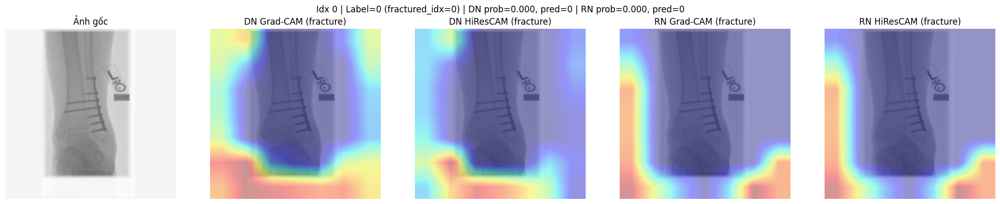


=== Ảnh test index 1 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=6.9364, prob=0.9990, pred=1
  ResNet : logit=4.8668, prob=0.9924, pred=1


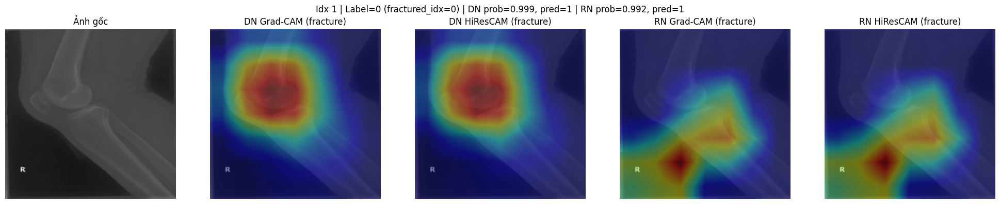


=== Ảnh test index 2 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-9.6140, prob=0.0001, pred=0
  ResNet : logit=-4.8211, prob=0.0080, pred=0


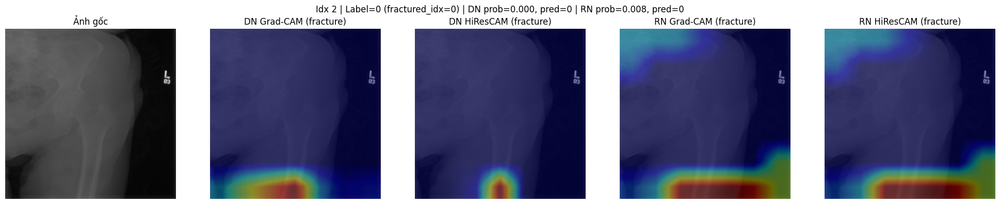


=== Ảnh test index 3 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-9.6140, prob=0.0001, pred=0
  ResNet : logit=-4.8211, prob=0.0080, pred=0


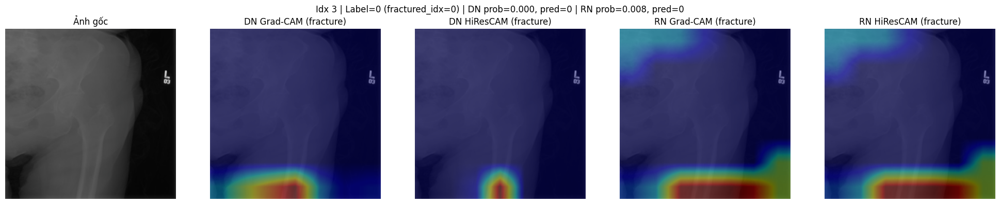


=== Ảnh test index 4 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-7.9845, prob=0.0003, pred=0
  ResNet : logit=-5.8851, prob=0.0028, pred=0


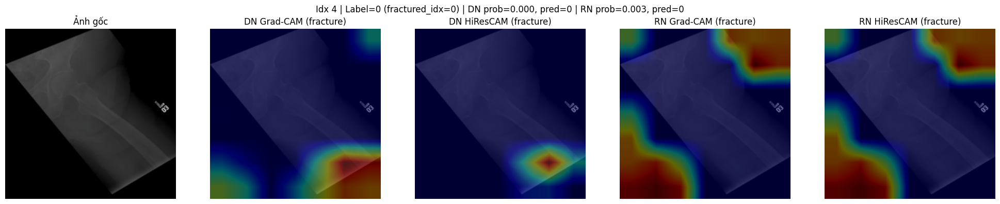


=== Ảnh test index 5 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-9.6140, prob=0.0001, pred=0
  ResNet : logit=-4.8211, prob=0.0080, pred=0


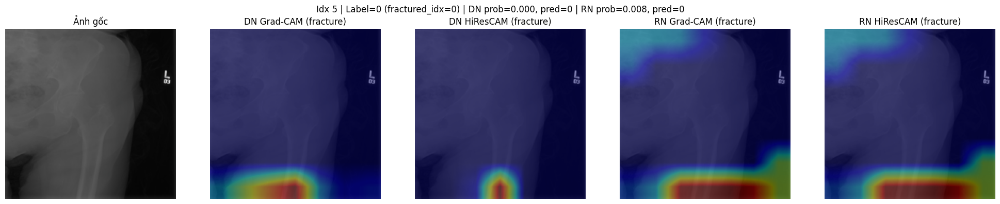


=== Ảnh test index 6 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-7.9845, prob=0.0003, pred=0
  ResNet : logit=-5.8851, prob=0.0028, pred=0


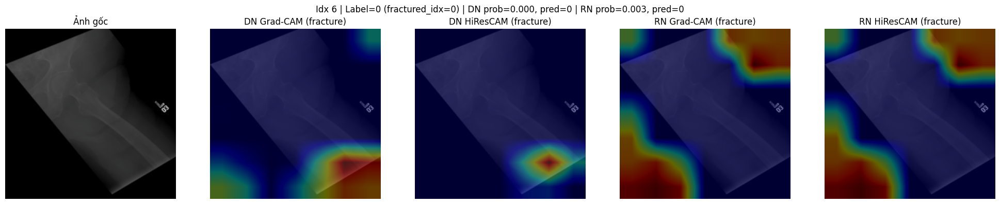


=== Ảnh test index 7 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-7.9845, prob=0.0003, pred=0
  ResNet : logit=-5.8851, prob=0.0028, pred=0


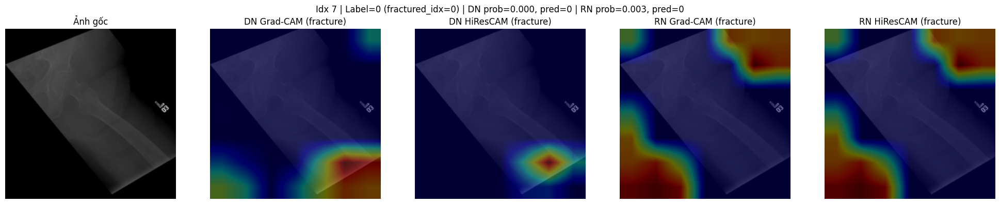


=== Ảnh test index 8 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-7.9845, prob=0.0003, pred=0
  ResNet : logit=-5.8851, prob=0.0028, pred=0


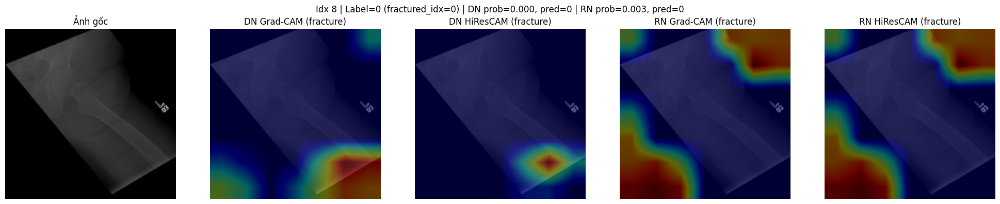


=== Ảnh test index 9 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=6.9364, prob=0.9990, pred=1
  ResNet : logit=4.8668, prob=0.9924, pred=1


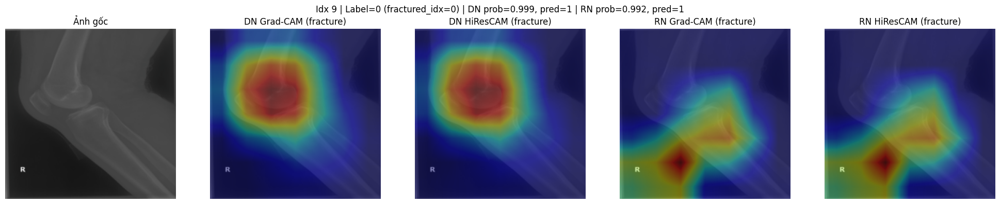


=== Ảnh test index 10 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-15.3960, prob=0.0000, pred=0
  ResNet : logit=-8.3990, prob=0.0002, pred=0


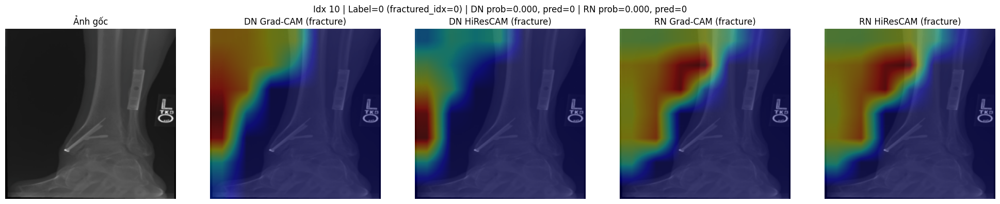


=== Ảnh test index 11 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-15.3960, prob=0.0000, pred=0
  ResNet : logit=-8.3990, prob=0.0002, pred=0


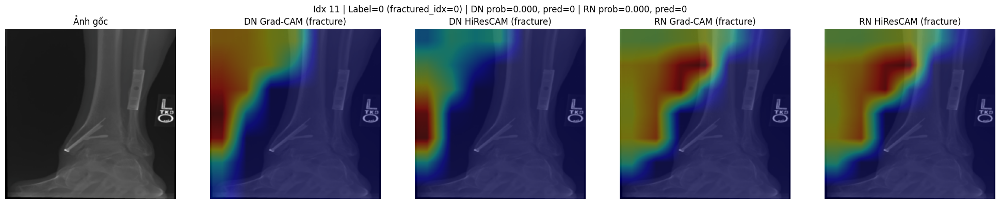


=== Ảnh test index 12 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-16.1960, prob=0.0000, pred=0
  ResNet : logit=-14.0341, prob=0.0000, pred=0


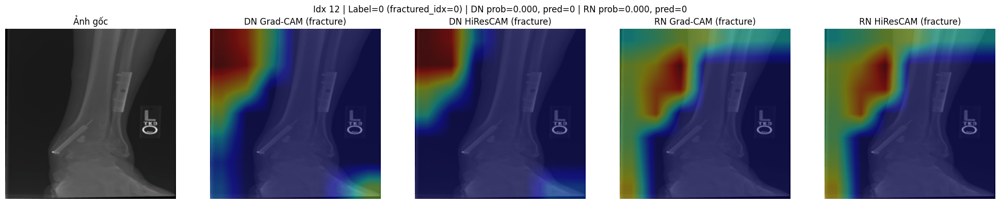


=== Ảnh test index 13 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-13.6013, prob=0.0000, pred=0
  ResNet : logit=-8.2096, prob=0.0003, pred=0


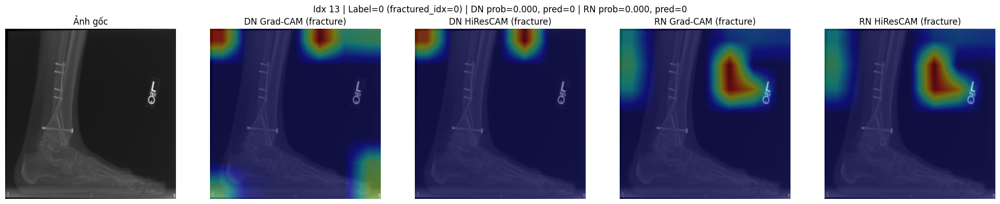


=== Ảnh test index 14 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-13.6013, prob=0.0000, pred=0
  ResNet : logit=-8.2096, prob=0.0003, pred=0


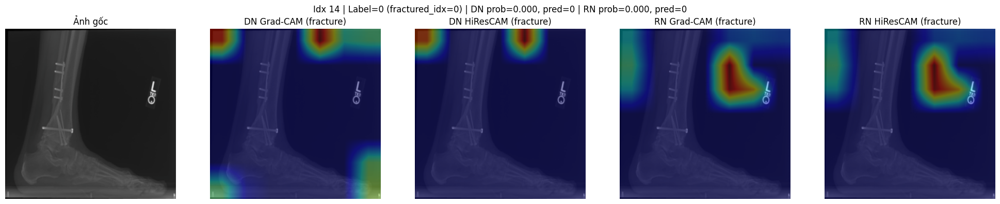


=== Ảnh test index 15 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-16.1960, prob=0.0000, pred=0
  ResNet : logit=-14.0341, prob=0.0000, pred=0


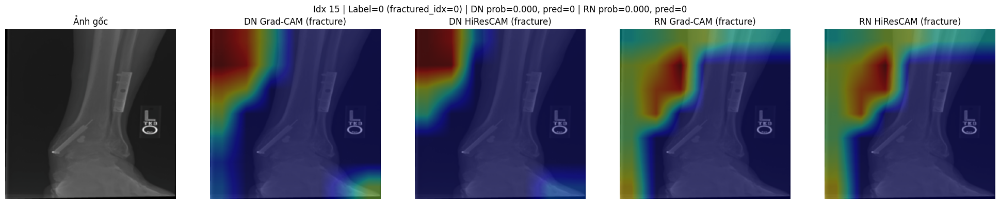


=== Ảnh test index 16 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-13.6013, prob=0.0000, pred=0
  ResNet : logit=-8.2096, prob=0.0003, pred=0


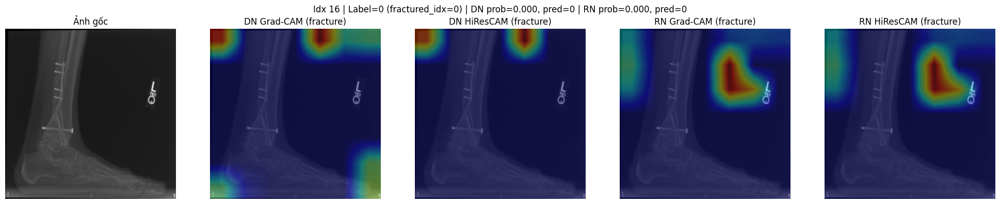


=== Ảnh test index 17 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-15.3960, prob=0.0000, pred=0
  ResNet : logit=-8.3990, prob=0.0002, pred=0


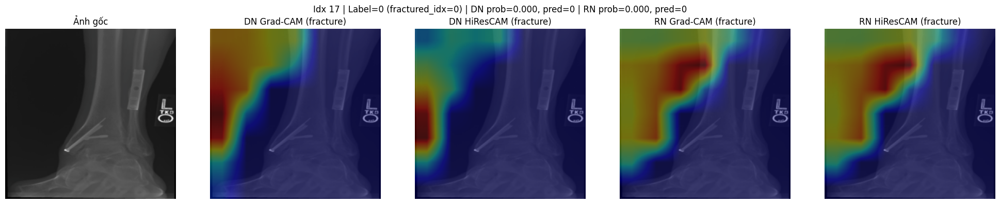


=== Ảnh test index 18 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-13.6013, prob=0.0000, pred=0
  ResNet : logit=-8.2096, prob=0.0003, pred=0


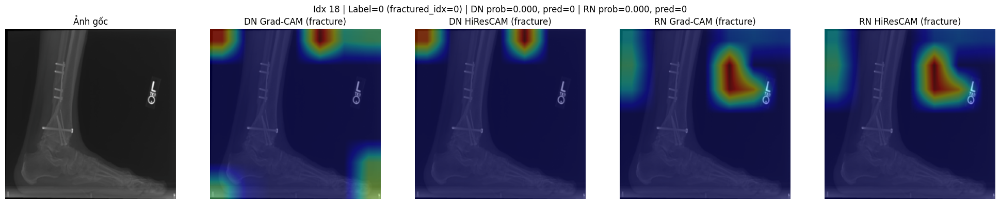


=== Ảnh test index 19 ===
  Nhãn thật (fractured_idx=0): 0
  DenseNet: logit=-9.6140, prob=0.0001, pred=0
  ResNet : logit=-4.8211, prob=0.0080, pred=0


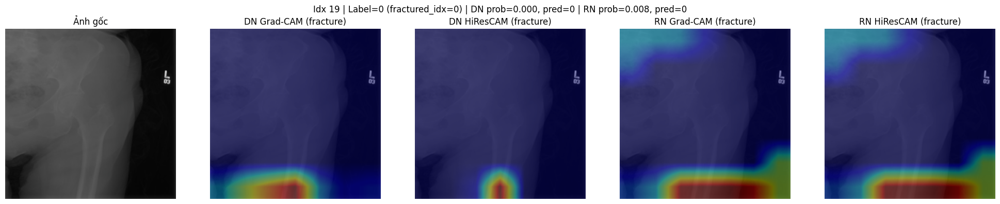

In [24]:
# ============================
# 6. DEMO: 20 ẢNH TEST GÃY XƯƠNG (HIỂN THỊ THEO HÀNG NGANG)
# ============================

print("Test class_to_idx:", test_dataset.class_to_idx)

# Sửa lại tên class cho đúng với thư mục gãy xương trong testing/
# ví dụ: "fractured", "Fractured", "Positive", ...
fractured_idx = test_dataset.class_to_idx["fractured"]  # ĐỔI CHUỖI NÀY NẾU CẦN

fractured_indices = [i for i, (_, y) in enumerate(test_dataset) if y == fractured_idx]
selected_indices = fractured_indices[:20]

print(f"Tổng số ảnh test gãy xương: {len(fractured_indices)}")
print(f"Đang dùng {len(selected_indices)} ảnh đầu tiên để test và sinh CAM.")

# Khởi tạo Grad-CAM / HiResCAM cho DenseNet và ResNet
target_layer_dn = densenet.features
grad_cam_dn  = GradCAM2D(densenet, target_layer_dn)
hires_cam_dn = HiResCAM2D(densenet, target_layer_dn)

target_layer_rn = resnet.layer4[-1]
grad_cam_rn  = GradCAM2D(resnet, target_layer_rn)
hires_cam_rn = HiResCAM2D(resnet, target_layer_rn)

for idx in selected_indices:
    # Lấy ảnh và nhãn từ test_dataset
    img, label = test_dataset[idx]      # img: [3,H,W], label == fractured_idx
    img_tensor = img.unsqueeze(0).to(device)  # [1,3,H,W]
    label_int = int(label)

    # ===== Dự đoán với DenseNet =====
    with torch.no_grad():
        logit_dn = densenet(img_tensor)              # [1,1]
        prob_dn = torch.sigmoid(logit_dn)[0, 0].item()
        pred_dn = int(prob_dn >= 0.5)                # 1 ~ dự đoán gãy xương

    # ===== Dự đoán với ResNet =====
    with torch.no_grad():
        logit_rn = resnet(img_tensor)                # [1,1]
        prob_rn = torch.sigmoid(logit_rn)[0, 0].item()
        pred_rn = int(prob_rn >= 0.5)

    print(f"\n=== Ảnh test index {idx} ===")
    print(f"  Nhãn thật (fractured_idx={fractured_idx}): {label_int}")
    print(f"  DenseNet: logit={logit_dn.item():.4f}, prob={prob_dn:.4f}, pred={pred_dn}")
    print(f"  ResNet : logit={logit_rn.item():.4f}, prob={prob_rn:.4f}, pred={pred_rn}")

    # ===== Tính CAM =====
    cam_dn_grad  = grad_cam_dn.generate_cam(img_tensor, pneumonia_class=True)
    cam_dn_hires = hires_cam_dn.generate_cam(img_tensor, pneumonia_class=True)
    cam_rn_grad  = grad_cam_rn.generate_cam(img_tensor, pneumonia_class=True)
    cam_rn_hires = hires_cam_rn.generate_cam(img_tensor, pneumonia_class=True)

    # ===== Hiển thị 1 hàng ngang: ảnh gốc + 4 CAM =====
    cams = [cam_dn_grad, cam_dn_hires, cam_rn_grad, cam_rn_hires]
    titles = [
        "DN Grad-CAM (fracture)",
        "DN HiResCAM (fracture)",
        "RN Grad-CAM (fracture)",
        "RN HiResCAM (fracture)",
    ]

    suptitle = (
        f"Idx {idx} | Label={label_int} (fractured_idx={fractured_idx}) | "
        f"DN prob={prob_dn:.3f}, pred={pred_dn} | "
        f"RN prob={prob_rn:.3f}, pred={pred_rn}"
    )

    show_row_with_original_and_cams(img_tensor, cams, titles, suptitle=suptitle)


In [25]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import numpy as np
import torch.nn.functional as F

@torch.no_grad()
def evaluate_full(model, loader, criterion, threshold=0.5):
    model.eval()
    all_labels = []
    all_probs  = []
    all_preds  = []
    running_loss = 0.0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device).float().unsqueeze(1)  # [B] -> [B,1]

        logits = model(images)          # [B,1]
        loss   = criterion(logits, labels)

        probs  = torch.sigmoid(logits)  # [B,1], xác suất lớp dương (fractured)
        preds  = (probs >= threshold).long()

        running_loss += loss.item() * images.size(0)
        total += images.size(0)

        all_labels.extend(labels.cpu().numpy().ravel())   # [B] -> list
        all_probs.extend(probs.cpu().numpy().ravel())
        all_preds.extend(preds.cpu().numpy().ravel())

    all_labels = np.array(all_labels)
    all_probs  = np.array(all_probs)
    all_preds  = np.array(all_preds)

    avg_loss = running_loss / total
    acc  = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, zero_division=0)
    rec  = recall_score(all_labels, all_preds, zero_division=0)
    f1   = f1_score(all_labels, all_preds, zero_division=0)
    cm   = confusion_matrix(all_labels, all_preds)

    return {
        "loss": avg_loss,
        "acc": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "cm": cm,
        "y_true": all_labels,
        "y_prob": all_probs,
        "y_pred": all_preds,
    }


In [26]:
print("=== ĐÁNH GIÁ TRÊN TẬP TEST (DENSENET-121) ===")
metrics_dn = evaluate_full(densenet, test_loader, criterion)

print(f"Test Loss      : {metrics_dn['loss']:.4f}")
print(f"Accuracy       : {metrics_dn['acc']*100:.2f}%")
print(f"Precision (pos): {metrics_dn['precision']*100:.2f}%")
print(f"Recall (pos)   : {metrics_dn['recall']*100:.2f}%")
print(f"F1-score (pos) : {metrics_dn['f1']*100:.2f}%")
print("Confusion matrix (rows = true, cols = pred):")
print(metrics_dn["cm"])
print()

print("=== ĐÁNH GIÁ TRÊN TẬP TEST (RESNET-50) ===")
metrics_rn = evaluate_full(resnet, test_loader, criterion)

print(f"Test Loss      : {metrics_rn['loss']:.4f}")
print(f"Accuracy       : {metrics_rn['acc']*100:.2f}%")
print(f"Precision (pos): {metrics_rn['precision']*100:.2f}%")
print(f"Recall (pos)   : {metrics_rn['recall']*100:.2f}%")
print(f"F1-score (pos) : {metrics_rn['f1']*100:.2f}%")
print("Confusion matrix (rows = true, cols = pred):")
print(metrics_rn["cm"])


=== ĐÁNH GIÁ TRÊN TẬP TEST (DENSENET-121) ===


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Test Loss      : 0.0810
Accuracy       : 98.62%
Precision (pos): 97.45%
Recall (pos)   : 100.00%
F1-score (pos) : 98.71%
Confusion matrix (rows = true, cols = pred):
[[231   7]
 [  0 268]]

=== ĐÁNH GIÁ TRÊN TẬP TEST (RESNET-50) ===


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Test Loss      : 0.0738
Accuracy       : 97.63%
Precision (pos): 97.41%
Recall (pos)   : 98.13%
F1-score (pos) : 97.77%
Confusion matrix (rows = true, cols = pred):
[[231   7]
 [  5 263]]
